In [2]:
import os.path as osp
import sys
cur_dir = osp.dirname(osp.abspath(''))
PROJ_ROOT = osp.normpath(osp.join(cur_dir))
sys.path.insert(0, PROJ_ROOT)
print(PROJ_ROOT)

from core.gdrn_modeling.demo.predictor_yolo import YoloPredictor
from core.gdrn_modeling.demo.predictor_gdrn import GdrnPredictor

import os

import numpy as np
import json
import cv2
import matplotlib.pyplot as plt

/home/meuli/gdrn_wkspc/gdrnpp_bop2022


/home/meuli/gdrn_wkspc/.venv/lib/python3.8/site-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(


You requested to import horovod which is missing or not supported for your OS.
[2023-11-10 10:12:47,812] [INFO] [real_accelerator.py:158:get_accelerator] Setting ds_accelerator to cuda (auto detect)


/home/meuli/gdrn_wkspc/gdrnpp_bop2022/lib/pysixd/misc.py:586: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def get_obj_im_c(K, t):
/home/meuli/gdrn_wkspc/gdrnpp_bop2022/lib/pysixd/misc.py:765: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def compute_2d_bbox_xyxy_from_pose(points, pose, K, width=640, height=480, clip=False):
/home/meuli/gdrn_wkspc/gdrnpp_bop202

vispy uses app: egl, gl: gl2


In [3]:
# Get all class names from classes.txt
classes = [line.rstrip() for line in open(cur_dir + "/unity_webcam_demo/classes.txt")]

# Split and Rectify Images

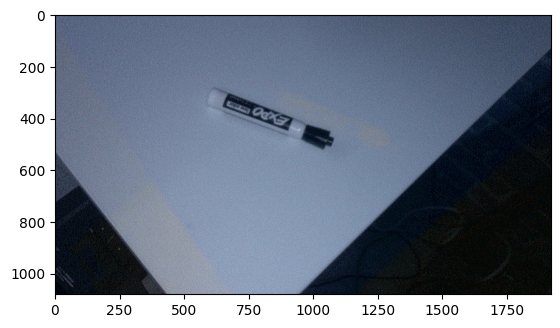

In [30]:
from stereo_rectify_images import StereoImageRectifier

calib_file = cur_dir + '/unity_webcam_demo/endoscope_files' + '/SN12398_calib_stereo.json'

# Alpha = 0 crops rectified images
img_rectifier = StereoImageRectifier(calib_file, alpha=0.0, resolution_multiplier=1.0, aspect_preserve=2.0)

img = cv2.imread("inogeni_captures/marker_2_light.jpg")
(img_right, img_left) = img_rectifier.split_and_rectify_stereo_image(img)

plt.imshow(img_right)

# Disparity Depth Map

In [5]:
from depth_mapping.stereo_pcd_utils import get_model, o3d_camera_intrinsics, run_dispartiy

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


In [6]:
def load_camera_calibration(file):
    # Load files
    with open(file, 'r') as f:
        calib_stereo = json.load(f)
        assert calib_stereo['type'] == 'stereo_camera_calibration'

    # Load the correct camera calibration
    K_left = np.array(calib_stereo['left']['K'])
    dist_left = np.array(calib_stereo['left']['distortion']['coefficients'])
    resolution_left = np.array(calib_stereo['left']['resolution'])

    K_right = np.array(calib_stereo['right']['K'])
    dist_right = np.array(calib_stereo['right']['distortion']['coefficients'])
    resolution_right = np.array(calib_stereo['right']['resolution'])

    # Sanity check: should hold for a rectified camera with the properties we want!
    assert np.all(K_left == K_right)
    assert not(np.any(dist_left))
    assert not(np.any(dist_right))
    assert np.all(resolution_left == resolution_right)
    assert K_left[0,0] == K_left[1,1]

    CameraLeft_T_CameraRight = np.array(calib_stereo['CamLeft_T_CamRight'])

    return K_left, resolution_left, CameraLeft_T_CameraRight

In [7]:
class arguments:
    files_dir = cur_dir + '/unity_webcam_demo/endoscope_files/'
    calib_file = files_dir + 'SN12398_calib_stereo.json'
    k_values, _ , camera_parameters = load_camera_calibration(files_dir + 'SN12398_calib_stereo_rectified.json')
    baseline_distance = camera_parameters[0, 3]
    model = 'hsmnet' # 'psmnet', 'hsmnet'
    no_cuda = False
    seed    = 1
    
    hsmnet_weights = [files_dir + 'middlebury-768px.tar', files_dir + 'kitti.tar'][0]
    clean = -1
    level = 1
    
    maxdisp = 256
    scale_percent = 100

In [8]:
def get_depth_map_normals(args, model, image_left, image_right, depth_scale=1, depth_trunc=2):
        
    disp_L = run_dispartiy(args=args, model=model, image_left=image_left, image_right=image_right)    
    o3d_intrinsics = o3d_camera_intrinsics(args.calib_file)
    depth_map = (args.k_values[0, 0] * args.baseline_distance) / disp_L
    
    depth_map  = cv2.resize(depth_map[..., None], image_left.shape[:2][::-1]) # crop maybe?
    
    return disp_L, depth_map

::INFO:: Loading HSMNet model..
Number of model parameters: 3174132


/home/meuli/gdrn_wkspc/.venv/lib/python3.8/site-packages/torch/nn/functional.py:3734: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")


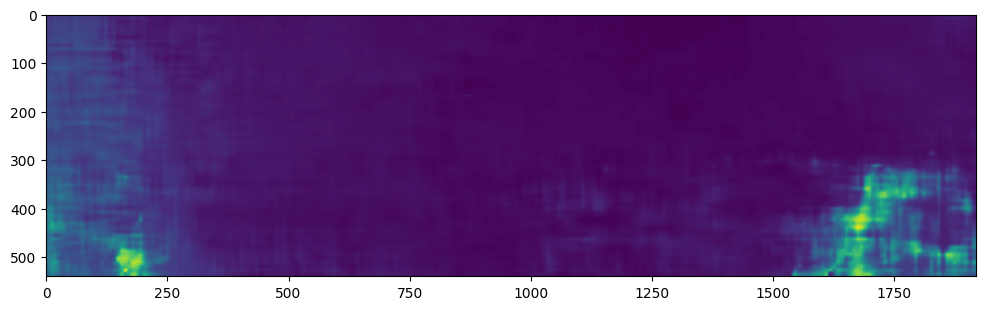

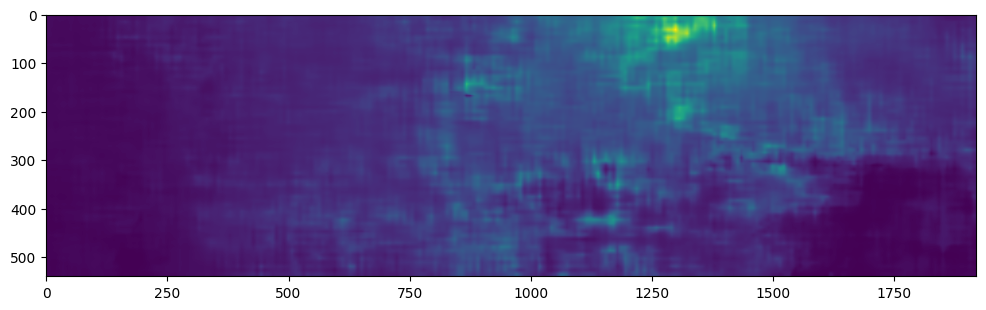

In [9]:


args  = arguments() # temp
    
model = get_model(args)
image_left  = img_left
image_right = img_right
if args.model in ['psmnet', 'hsmnet']:
    image_left  = cv2.resize(image_left, (1920, 540))
    image_right = cv2.resize(image_right, (1920, 540))
    
img_shape = image_left.shape
disp_L, depth_map = get_depth_map_normals(args, model, image_left, image_right)

plt.figure(figsize=(12, 16))
plt.imshow(disp_L[..., None])
plt.show()

plt.figure(figsize=(12, 16))
plt.imshow(depth_map[..., None])
plt.show()

# YOLO Prediction

In [10]:
yolo_predictor = YoloPredictor(
                    exp_name="yolox-x",
                    config_file_path=osp.join(PROJ_ROOT,"configs/yolox/bop_pbr/yolox_x_640_augCozyAAEhsv_ranger_30_epochs_ycbv_pbr_ycbv_bop_test.py"),
                    ckpt_file_path=osp.join(PROJ_ROOT,"output/yolox/model_final.pth"),
                    fuse=True,
                    fp16=False
                    )

INFO - 2023-11-10 10:13:02,988 - predictor_yolo - Model Summary: Params: 99.07M, Gflops: 282.46
INFO - 2023-11-10 10:13:03,198 - predictor_yolo - loading checkpoint


[1110_101303 det.yolox.engine.yolox_setup@99]: Rank of current process: 0. World size: 1
[1110_101303 det.yolox.engine.yolox_setup@100]: Environment info:
-------------------------------  ----------------------------------------------------------------------------------
sys.platform                     linux
Python                           3.8.10 (default, May 26 2023, 14:05:08) [GCC 9.4.0]
numpy                            1.24.1
detectron2                       0.6 @/home/meuli/gdrn_wkspc/.venv/lib/python3.8/site-packages/detectron2
Compiler                         GCC 9.4
CUDA compiler                    CUDA 11.6
detectron2 arch flags            6.1
DETECTRON2_ENV_MODULE            <not set>
PyTorch                          1.13.1+cu116 @/home/meuli/gdrn_wkspc/.venv/lib/python3.8/site-packages/torch
PyTorch debug build              False
torch._C._GLIBCXX_USE_CXX11_ABI  False
GPU available                    Yes
GPU 0                            Quadro P620 (arch=6.1)
Driver version

In [11]:
from det.yolox.utils import get_model_info, fuse_model, postprocess, vis
def vis_yolo(output, rgb_image, class_names, cls_conf=0.35):
    # rgb_image = cv2.cvtColor(rgb_image, cv2.COLOR_BGR2RGB)
    if output is None:
        return rgb_image
    output = output.cpu()

    bboxes = output[:, 0:4]

    cls = output[:, 6]
    scores = output[:, 4] * output[:, 5]

    vis_res = vis(rgb_image, bboxes, scores, cls, cls_conf, class_names)
    return vis_res

In [12]:
img_resize = cv2.resize(img_right, dsize=(640, 480), interpolation=cv2.INTER_CUBIC)

/home/meuli/gdrn_wkspc/gdrnpp_bop2022/core/gdrn_modeling/demo/predictor_yolo.py:137: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  detections = torch.tensor(detections[detections[:, 6].argsort()])


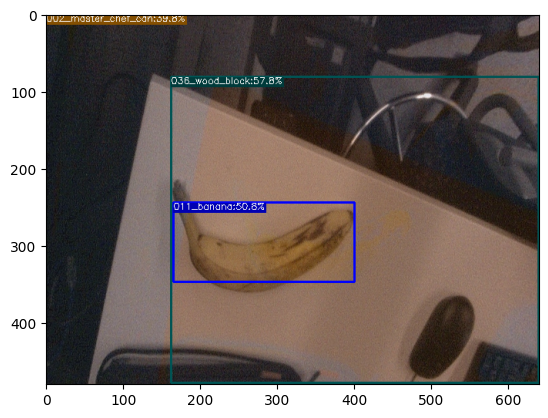

In [13]:
output = yolo_predictor.inference(img_resize)
out = vis_yolo(output[0], img_resize, classes, cls_conf=0.35)
plt.imshow(cv2.cvtColor(out, cv2.COLOR_BGR2RGB))

# GDRN Pose Prediction

In [14]:
gdrn_predictor = GdrnPredictor(
                    config_file_path=osp.join(PROJ_ROOT,"configs/gdrn/ycbv/convnext_a6_AugCosyAAEGray_BG05_mlL1_DMask_amodalClipBox_classAware_ycbv.py"),
                    ckpt_file_path=osp.join(PROJ_ROOT,"output/gdrn/ycbv/model_final_wo_optim.pth"),
                    # ckpt_file_path=osp.join(PROJ_ROOT,"output/gdrn/ycbv/model_tomato_soup_can.pth"),
                    camera_json_path=osp.join(PROJ_ROOT,"datasets/BOP_DATASETS/ycbv/camera_cmu.json"),
                    path_to_obj_models=osp.join(PROJ_ROOT,"datasets/BOP_DATASETS/ycbv/models")
)

[1110_231308@predictor_gdrn:602] optimizer_cfg: {'type': 'Ranger', 'lr': 0.0008, 'weight_decay': 0.01}


20231110_101310|core.utils.default_args_setup@123: Rank of current process: 0. World size: 1
20231110_101310|core.utils.default_args_setup@124: Environment info:
-------------------------------  ----------------------------------------------------------------------------------
sys.platform                     linux
Python                           3.8.10 (default, May 26 2023, 14:05:08) [GCC 9.4.0]
numpy                            1.24.1
detectron2                       0.6 @/home/meuli/gdrn_wkspc/.venv/lib/python3.8/site-packages/detectron2
Compiler                         GCC 9.4
CUDA compiler                    CUDA 11.6
detectron2 arch flags            6.1
DETECTRON2_ENV_MODULE            <not set>
PyTorch                          1.13.1+cu116 @/home/meuli/gdrn_wkspc/.venv/lib/python3.8/site-packages/torch
PyTorch debug build              False
torch._C._GLIBCXX_USE_CXX11_ABI  False
GPU available                    Yes
GPU 0                            Quadro P620 (arch=6.1)
Driver 

[1110_101310 d2.utils.env@41]: Using a generated random seed 10726884


Global seed set to 10726884
20231110_101310|core.utils.default_args_setup@144: Full config saved to output/gdrn/ycbv/convnext_a6_AugCosyAAEGray_BG05_mlL1_DMask_amodalClipBox_classAware_ycbv/convnext_a6_AugCosyAAEGray_BG05_mlL1_DMask_amodalClipBox_classAware_ycbv.py
20231110_101310|core.utils.default_args_setup@162: Used mmcv backend: cv2
INFO - 2023-11-10 10:13:11,877 - helpers - Loading pretrained weights from url (https://dl.fbaipublicfiles.com/convnext/convnext_base_1k_224_ema.pth)


[1110_101312 d2.checkpoint.detection_checkpoint@38]: [DetectionCheckpointer] Loading from /home/meuli/gdrn_wkspc/gdrnpp_bop2022/output/gdrn/ycbv/model_final_wo_optim.pth ...
[1110_101312 fvcore.common.checkpoint@150]: [Checkpointer] Loading from /home/meuli/gdrn_wkspc/gdrnpp_bop2022/output/gdrn/ycbv/model_final_wo_optim.pth ...


In [15]:
data_dict = gdrn_predictor.preprocessing(outputs=output, image=img_resize)

In [16]:
out_dict = gdrn_predictor.inference(data_dict)

In [17]:
poses = gdrn_predictor.postprocessing(data_dict, out_dict)

In [18]:
print(poses['040_large_marker'])

In [19]:
gdrn_imgs = gdrn_predictor.gdrn_visualization(batch=data_dict, out_dict=out_dict, image=img_resize)

[[ 0.83091423 -0.34096362  0.43968779  0.02886108]
 [ 0.53676914  0.28316074 -0.79479487 -0.02075645]
 [ 0.14649382  0.8964172   0.41830103  0.16141809]
 [ 0.          0.          0.          1.        ]]
17
Calculating stereo rectification...
P_left:
[[1.57466523e+03 0.00000000e+00 9.53244904e+02 0.00000000e+00]
 [0.00000000e+00 1.57466523e+03 5.55632736e+02 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00 0.00000000e+00]]

P_right:
[[ 1.57466523e+03  0.00000000e+00  9.53244904e+02 -9.28543563e+00]
 [ 0.00000000e+00  1.57466523e+03  5.55632736e+02  0.00000000e+00]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00  0.00000000e+00]]

Q = 
[[ 1.00000000e+00  0.00000000e+00  0.00000000e+00 -9.53244904e+02]
 [ 0.00000000e+00  1.00000000e+00  0.00000000e+00 -5.55632736e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.57466523e+03]
 [ 0.00000000e+00  0.00000000e+00  1.69584421e+02 -0.00000000e+00]]

K_rect (for both left and right):
[[1.57466523e+03 0.00000000e+00 9.53

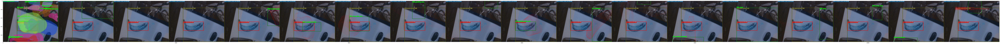

In [20]:
plt.figure(figsize=(200,20))
plt.imshow(gdrn_imgs)

In [21]:
img = cv2.imread(img_dir)
output = yolo_predictor.inference(img)
data_dict = gdrn_predictor.preprocessing(outputs=output, image=img)
out_dict = gdrn_predictor.inference(data_dict)
poses = gdrn_predictor.postprocessing(data_dict, out_dict)

NameError: name 'img_dir' is not defined